# ip-adapter

1. 导入模型

In [1]:
from diffusers import AutoPipelineForText2Image
from diffusers.utils import load_image, make_image_grid
import torch

pipeline = AutoPipelineForText2Image.from_pretrained("/home/zjt/model/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16).to("cuda")
pipeline.load_ip_adapter("/home/zjt/model/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter_sdxl.bin")


/home/zjt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

2. 看起来在text2image过程中,ip_adapter_image可以影响出图的风格.

  0%|          | 0/100 [00:00<?, ?it/s]

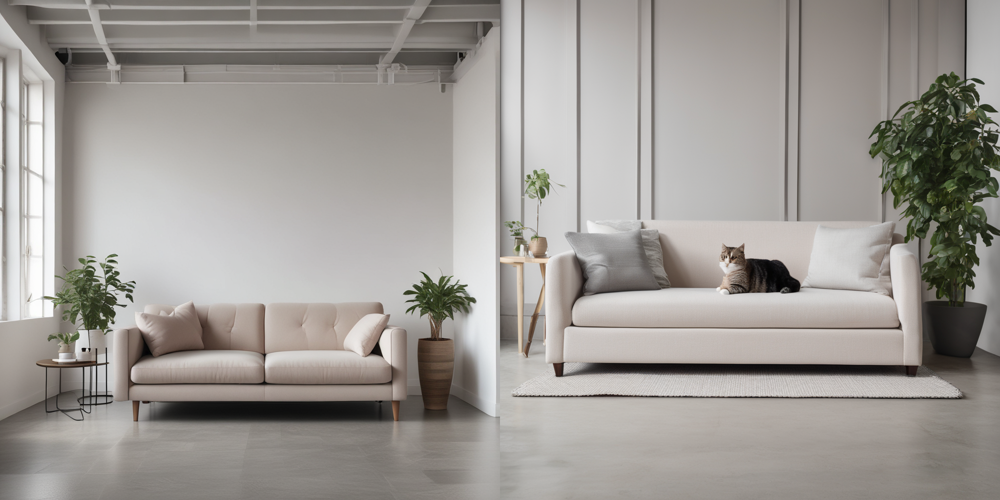

In [3]:
image = load_image('./images/sofa.png')
generator = torch.Generator(device="cpu").manual_seed(0)
pipeline.set_ip_adapter_scale(0.4)
images = pipeline(
    prompt="a cat on the sofa",
    ip_adapter_image=image,
    negative_prompt="deformed, ugly, wrong proportion, low res, bad anatomy, worst quality, low quality",
    num_inference_steps=100,
    generator=generator,
).images
make_image_grid([image,images[0]],rows=1,cols=2)

In [9]:
from diffusers import AutoPipelineForImage2Image

img2img_pipeline = AutoPipelineForImage2Image.from_pipe(pipeline)


3. 看起来img2img的过程中,不太知道ip_adapter_image怎么去影响出图的效果.

  0%|          | 0/30 [00:00<?, ?it/s]

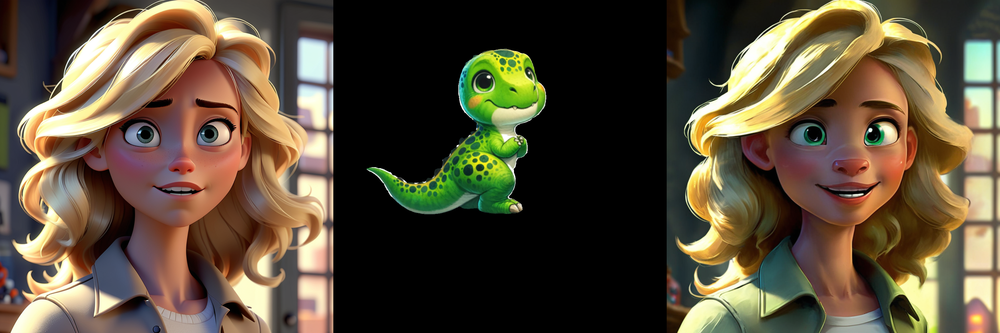

In [21]:
image = load_image("./images/ip_mask_girl2.png")
ip_image = load_image("./picture_books/img2.png")

generator = torch.Generator(device="cpu").manual_seed(4)
img2img_pipeline.set_ip_adapter_scale(0.8)
images = img2img_pipeline(
    prompt="best quality, high quality",
    image=image,
    ip_adapter_image=ip_image,
    generator=generator,
    strength=0.6,
).images
make_image_grid([image,ip_image,images[0]],rows=1,cols=3)

In [4]:
from diffusers import AutoPipelineForInpainting
inpainting_pipeline = AutoPipelineForInpainting.from_pipe(pipeline)

4. 看起来是把mask的区域重绘了,然后画上了ip_image

  0%|          | 0/99 [00:00<?, ?it/s]

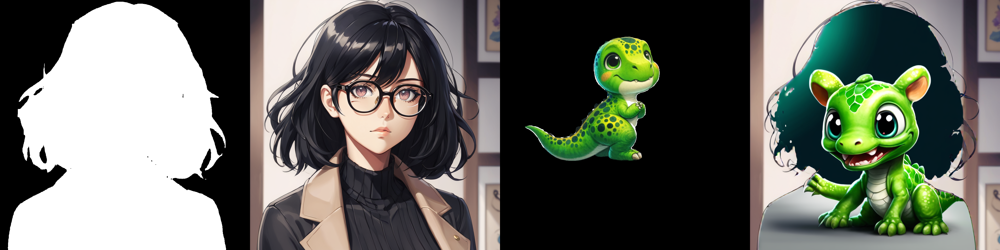

In [6]:
mask_image = load_image("./images/ip_mask_girl1_mask.png")
image = load_image("./images/ip_mask_girl1.png")
ip_image = load_image("./picture_books/img2.png")

generator = torch.Generator(device="cpu").manual_seed(4)
images = inpainting_pipeline(
    prompt="best quality, high quality",
    image=image,
    mask_image=mask_image,
    ip_adapter_image=ip_image,
    generator=generator,
    num_inference_steps=100,
).images
make_image_grid([mask_image,image,ip_image,images[0]],rows=1,cols=4)

In [2]:
from diffusers import StableDiffusionXLPipeline
import torch
from transformers import CLIPVisionModelWithProjection

image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "/home/zjt/model/IP-Adapter",
    subfolder="models/image_encoder",
    torch_dtype=torch.float16,
)

pipeline = StableDiffusionXLPipeline.from_pretrained(
            "/home/zjt/model/stable-diffusion-xl-base-1.0",
            image_encoder=image_encoder,
    torch_dtype=torch.float16,

        )
pipeline.to('cuda')
pipeline.load_ip_adapter("/home/zjt/model/IP-Adapter", subfolder="sdxl_models", weight_name=["ip-adapter-plus-face_sdxl_vit-h.safetensors"] * 2)
pipeline.set_ip_adapter_scale([0.6] * 2)
generator = torch.Generator(device="cpu").manual_seed(4)
num_images = 1

/home/zjt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

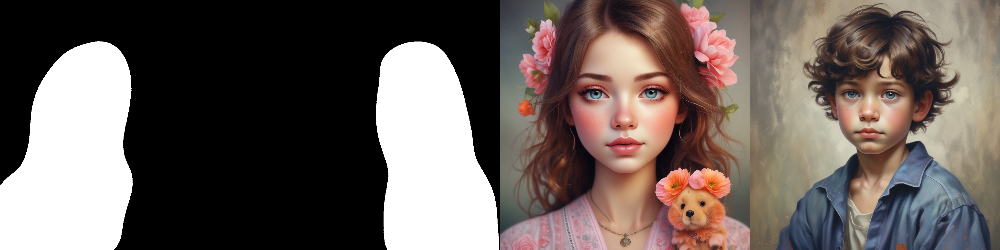

In [1]:
from diffusers.image_processor import IPAdapterMaskProcessor
from diffusers.utils import load_image, make_image_grid
mask1 = load_image("./images/ip_mask_mask1.png")
mask2 = load_image("./images/ip_mask_mask2.png")

output_height = 1024
output_width = 1024

processor = IPAdapterMaskProcessor()
masks = processor.preprocess([mask1, mask2], height=output_height, width=output_width)
face_image1 = load_image("./images/girl2.png")
face_image2 = load_image("./images/boy2.png")

ip_images = [[face_image1], [face_image2]]
make_image_grid([mask1,mask2,face_image1,face_image2],rows=1,cols=4)

5. 

  0%|          | 0/20 [00:00<?, ?it/s]

cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 and will be ignored.
cross_attention_kwargs ['ip_adapter_masks'] are not expected by AttnProcessor2_0 a

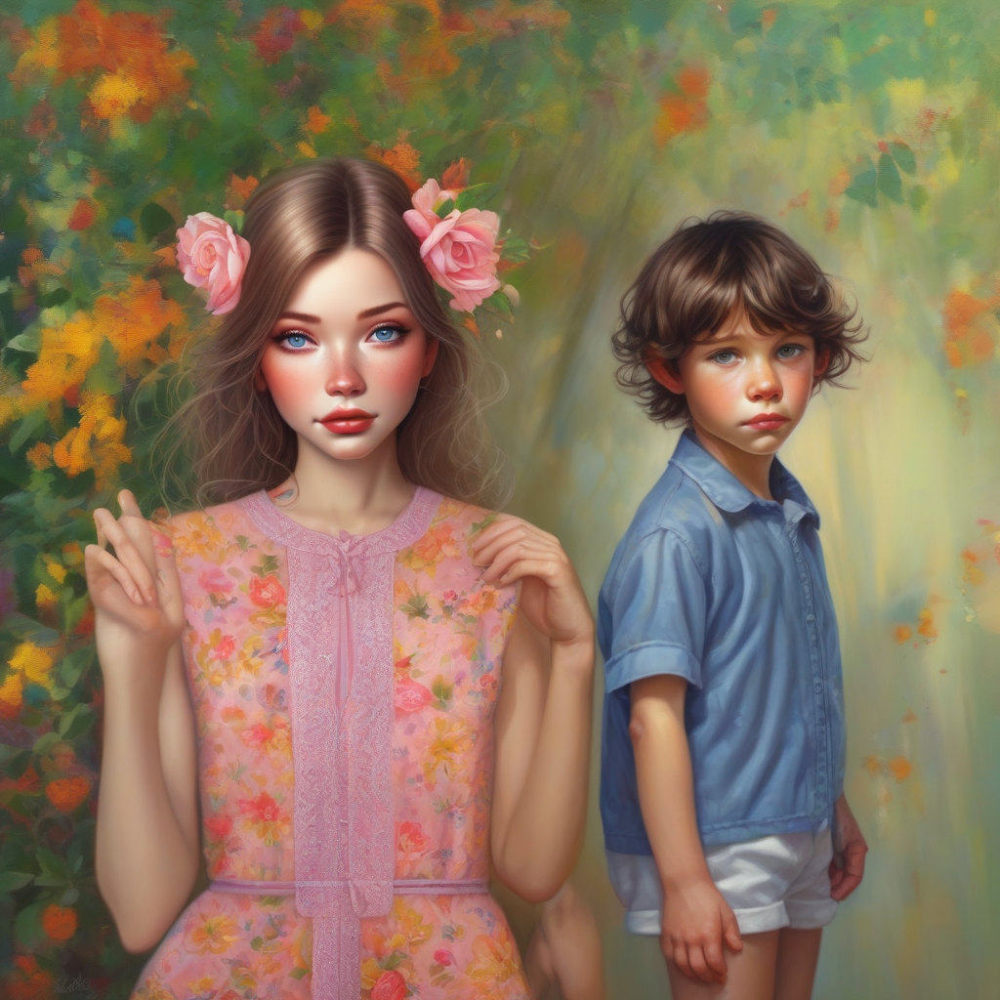

In [3]:

image = pipeline(
    prompt="2 girls",
    ip_adapter_image=ip_images,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    num_inference_steps=20,
    num_images_per_prompt=num_images,
    generator=generator,
    cross_attention_kwargs={"ip_adapter_masks": masks}
).images[0]
image